In [1]:
import os
import requests
import pandas as pd
import geopandas as gpd
import numpy as np
import pickle
from loguru import logger

TRANSPORT_FRAMES_API = "http://10.32.1.65:5700"
URBAN_API = "https://urban-api.idu.kanootoko.org/api/v1"

ModuleNotFoundError: No module named 'requests'

In [ ]:
territory_gdf = gpd.read_file('data/level_4_territories.geojson').to_crs(32636)
road_gdf = gpd.read_file('/Users/mvin/Code/PopFrame_API/transport_provision/road.geojson').to_crs(32636)
railways_gdf = gpd.read_file('/Users/mvin/Code/PopFrame_API/transport_provision/ЖД пути.geojson').to_crs(32636)
water = gpd.read_file('/Users/mvin/Code/PopFrame_API/transport_provision/big water.geojson').to_crs(32636)
airport = gpd.read_file('/Users/mvin/Code/PopFrame_API/transport_provision/airport.geojson').to_crs(32636)
towns_gdf = gpd.read_file('/Users/mvin/Code/PopFrame_API/transport_provision/towns_with_status.geojson').to_crs(32636)

In [3]:
territory_gdf

,territory_id,territory_type,parent,name,level,properties,admin_center,target_city_type,okato_code,oktmo_code,is_city,created_at,updated_at,geometry
0,3,"{ ""id"": 3, ""name"": ""Поселение"" }","{ ""id"": 2, ""name"": ""Бокситогорский муниципальн...",Самойловское сельское поселение,4,"{ ""Численность населения"": 2154, ""Администрати...","{ ""id"": 310, ""name"": ""поселок Совхозный"" }",None,41203876000,41603476,False,2024-06-16 21:35:40.802000+00:00,2024-11-14 12:17:52.704000+00:00,"POLYGON ((580049.515 6617067.72, 580225.344 66..."
1,4,"{ ""id"": 3, ""name"": ""Поселение"" }","{ ""id"": 2, ""name"": ""Бокситогорский муниципальн...",Большедворское сельское поселение,4,"{ ""Численность населения"": 1698, ""Администрати...","{ ""id"": 427, ""name"": ""деревня Большой Двор"" }",None,41203812000,41603412,False,2024-06-16 21:35:40.802000+00:00,2024-11-14 12:17:34.396000+00:00,"POLYGON ((573514.444 6620389.851, 573579.919 6..."
2,5,"{ ""id"": 3, ""name"": ""Поселение"" }","{ ""id"": 2, ""name"": ""Бокситогорский муниципальн...",Пикалевское городское поселение,4,"{ ""Численность населения"": 20169, ""Администрат...","{ ""id"": 335, ""name"": ""город Пикалево"" }",None,41440000000,41603102,False,2024-06-16 21:35:40.802000+00:00,2024-11-14 12:17:34.930000+00:00,"POLYGON ((564707.328 6594903.594, 564341.814 6..."
3,6,"{ ""id"": 3, ""name"": ""Поселение"" }","{ ""id"": 2, ""name"": ""Бокситогорский муниципальн...",Борское сельское поселение,4,"{ ""Численность населения"": 3393, ""Администрати...","{ ""id"": 2859, ""name"": ""деревня Бор"" }",None,41203816000,41603416,False,2024-06-16 21:35:40.802000+00:00,2024-11-14 12:17:35.368000+00:00,"POLYGON ((560629.509 6557332.762, 560642.857 6..."
4,7,"{ ""id"": 3, ""name"": ""Поселение"" }","{ ""id"": 2, ""name"": ""Бокситогорский муниципальн...",Бокситогорское городское поселение,4,"{ ""Численность населения"": 15960, ""Администрат...","{ ""id"": 328, ""name"": ""город Бокситогорск"" }",None,41403000000,41603101,False,2024-06-16 21:35:40.802000+00:00,2024-11-14 12:17:36.351000+00:00,"POLYGON ((560659.317 6585430.874, 559919.213 6..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184,204,"{ ""id"": 3, ""name"": ""Поселение"" }","{ ""id"": 193, ""name"": ""Тосненский муниципальный...",Красноборское городское поселение,4,"{ ""Численность населения"": 4507, ""Администрати...","{ ""id"": 3072, ""name"": ""городской поселок Красн...",None,41248554000,41648154,False,2024-06-16 21:35:40.802000+00:00,2024-11-14 12:19:09.784000+00:00,"POLYGON ((363803.737 6614904.469, 363821.597 6..."
185,205,"{ ""id"": 3, ""name"": ""Поселение"" }","{ ""id"": 193, ""name"": ""Тосненский муниципальный...",Трубникоборское сельское поселение,4,"{ ""Численность населения"": 1620, ""Администрати...","{ ""id"": 3122, ""name"": ""деревня Трубников Бор"" }",None,41248844000,41648444,False,2024-06-16 21:35:40.802000+00:00,2024-11-14 12:19:10.264000+00:00,"POLYGON ((392924.072 6551507.217, 393174.409 6..."
186,206,"{ ""id"": 3, ""name"": ""Поселение"" }","{ ""id"": 193, ""name"": ""Тосненский муниципальный...",Лисинское сельское поселение,4,"{ ""Численность населения"": 1919, ""Администрати...","{ ""id"": 3095, ""name"": ""поселок Лисино-Корпус"" }",None,41248830000,41648430,False,2024-06-16 21:35:40.802000+00:00,2024-11-14 12:19:25.346000+00:00,"POLYGON ((363959.223 6596385.107, 364013.066 6..."
187,1267,"{ ""id"": 4, ""name"": ""Город"" }","{ ""id"": 182, ""name"": ""Сосновоборский городской...",город Сосновый бор,4,{ },None,None,41454000000,41754000001,True,2024-06-16 21:35:40.802000+00:00,2024-11-29 11:31:30.081000+00:00,"POLYGON ((283435.008 6647206.979, 283361.394 6..."


In [5]:
territory_gdf = territory_gdf.overlay(water, how='difference')
territory_gdf.head()

,territory_id,territory_type,parent,name,level,properties,admin_center,target_city_type,okato_code,oktmo_code,is_city,created_at,updated_at,geometry
0,3,"{ ""id"": 3, ""name"": ""Поселение"" }","{ ""id"": 2, ""name"": ""Бокситогорский муниципальн...",Самойловское сельское поселение,4,"{ ""Численность населения"": 2154, ""Администрати...","{ ""id"": 310, ""name"": ""поселок Совхозный"" }",None,41203876000,41603476,False,2024-06-16 21:35:40.802000+00:00,2024-11-14 12:17:52.704000+00:00,"POLYGON ((580049.515 6617067.72, 580225.344 66..."
1,4,"{ ""id"": 3, ""name"": ""Поселение"" }","{ ""id"": 2, ""name"": ""Бокситогорский муниципальн...",Большедворское сельское поселение,4,"{ ""Численность населения"": 1698, ""Администрати...","{ ""id"": 427, ""name"": ""деревня Большой Двор"" }",None,41203812000,41603412,False,2024-06-16 21:35:40.802000+00:00,2024-11-14 12:17:34.396000+00:00,"POLYGON ((573514.444 6620389.851, 573579.919 6..."
2,5,"{ ""id"": 3, ""name"": ""Поселение"" }","{ ""id"": 2, ""name"": ""Бокситогорский муниципальн...",Пикалевское городское поселение,4,"{ ""Численность населения"": 20169, ""Администрат...","{ ""id"": 335, ""name"": ""город Пикалево"" }",None,41440000000,41603102,False,2024-06-16 21:35:40.802000+00:00,2024-11-14 12:17:34.930000+00:00,"POLYGON ((564707.328 6594903.594, 564341.814 6..."
3,6,"{ ""id"": 3, ""name"": ""Поселение"" }","{ ""id"": 2, ""name"": ""Бокситогорский муниципальн...",Борское сельское поселение,4,"{ ""Численность населения"": 3393, ""Администрати...","{ ""id"": 2859, ""name"": ""деревня Бор"" }",None,41203816000,41603416,False,2024-06-16 21:35:40.802000+00:00,2024-11-14 12:17:35.368000+00:00,"POLYGON ((560629.509 6557332.762, 560642.857 6..."
4,7,"{ ""id"": 3, ""name"": ""Поселение"" }","{ ""id"": 2, ""name"": ""Бокситогорский муниципальн...",Бокситогорское городское поселение,4,"{ ""Численность населения"": 15960, ""Администрат...","{ ""id"": 328, ""name"": ""город Бокситогорск"" }",None,41403000000,41603101,False,2024-06-16 21:35:40.802000+00:00,2024-11-14 12:17:36.351000+00:00,"POLYGON ((560659.317 6585430.874, 559919.213 6..."


In [ ]:
# Добавляем новый столбец с длиной дороги в километрах
road_gdf['road_length_km'] = road_gdf['geometry'].length / 1000
road_gdf.head()

,physical_object_id,physical_object_type,name,properties,living_building,territories,created_at,updated_at,geometry,road_length_km
0,2212129,"{ ""physical_object_type_id"": 50, ""name"": ""Феде...",А-120,"{ ""reg"": 1, ""type"": ""car"", ""highway"": ""primary...",None,"[ { ""id"": 111, ""name"": ""Кировское городское по...",2024-11-26 13:36:41.630000+00:00,2024-11-26 13:36:41.630000+00:00,"LINESTRING (388726.347 6637020.627, 388713.674...",0.015971
1,2212130,"{ ""physical_object_type_id"": 50, ""name"": ""Феде...",Р-23,"{ ""reg"": 1, ""type"": ""car"", ""highway"": ""primary...",None,"[ { ""id"": 2326, ""name"": ""кордон Глубокий Ручей...",2024-11-26 13:36:41.851000+00:00,2024-11-26 13:36:41.851000+00:00,"LINESTRING (318413.688 6517004.443, 318561.905...",0.392273
2,2212131,"{ ""physical_object_type_id"": 50, ""name"": ""Феде...",А-114,"{ ""reg"": 1, ""type"": ""car"", ""highway"": ""trunk"",...",None,"[ { ""id"": 186, ""name"": ""Тихвинское городское п...",2024-11-26 13:36:45.467000+00:00,2024-11-26 13:36:45.467000+00:00,"LINESTRING (529615.157 6616409.736, 529590.351...",1.866937
3,2212132,"{ ""physical_object_type_id"": 50, ""name"": ""Феде...",А-121,"{ ""reg"": 1, ""type"": ""car"", ""highway"": ""trunk"",...",None,"[ { ""id"": 1199, ""name"": ""поселок Сапёрное"" } ]",2024-11-26 13:36:45.459000+00:00,2024-11-26 13:36:45.459000+00:00,"LINESTRING (335867.781 6734765.116, 335668.012...",0.447109
4,2212133,"{ ""physical_object_type_id"": 50, ""name"": ""Феде...",А-121,"{ ""reg"": 1, ""type"": ""car"", ""highway"": ""seconda...",None,"[ { ""id"": 1173, ""name"": ""поселок Плафторма 69-...",2024-11-26 13:36:45.476000+00:00,2024-11-26 13:36:45.476000+00:00,"LINESTRING (346440.758 6711866.978, 346447.143...",0.024717


In [7]:
# Добавляем новый столбец с длиной дороги в километрах
railways_gdf['road_length_km'] = railways_gdf['geometry'].length / 1000
railways_gdf.head()

,GLOBALID,CLASSID,NUMBER,NAME,CAT_RR,EL_SUPPLY,TRACK_TYPE,NUM_TRACKS,CAPACITY,SUBURBAN_TR,...,EVENT_TIME,SOURCE,NOTE,STATUS,REG_STATUS,built_year,layer,path,geometry,road_length_km
0,5B11B81A-05CF-4E47-8345-130B6B289DA8,602030101,,Северо-Восточный обход Павлово на Неве - Оредеж,7.0,1.0,1.0,3.0,0.0,0.0,...,0.0,,,2.0,1.0,NaN,rail ЛО,C:/Users/kvary/Downloads/Telegram Desktop/rail...,"LINESTRING (379205.593 6635545.721, 379039.913...",3.501744
1,2D6AA273-E08F-4BA4-80B3-BB561FD9EFFD,602030101,,Юго-Западный железнодорожный обход Санкт-Петер...,7.0,1.0,1.0,1.0,0.0,0.0,...,0.0,,,2.0,1.0,2030.0,rail ЛО,C:/Users/kvary/Downloads/Telegram Desktop/rail...,"LINESTRING (308041.472 6649937.16, 307983.753 ...",65.544295
2,A289FEE2-CAB0-4546-A1E5-0E2A816B54F6,602030101,,Бусловская – Вайниккала (искл.),5.0,1.0,1.0,1.0,0.0,0.0,...,0.0,,,1.0,1.0,NaN,rail ЛО,C:/Users/kvary/Downloads/Telegram Desktop/rail...,"LINESTRING (246843.638 6755670.538, 246871.412...",2.772776
3,CBE9BC6E-3D87-4A8B-A4F6-0C196C885FD5,602030101,,Юго-Западный железнодорожный обход Санкт-Петер...,7.0,1.0,1.0,1.0,0.0,0.0,...,0.0,,,2.0,1.0,NaN,rail ЛО,C:/Users/kvary/Downloads/Telegram Desktop/rail...,"LINESTRING (304012.441 6650457.401, 303896.607...",4.259202
4,3DADEBA5-4619-48FE-B234-3A19F8A9C370,602030101,,Выборг – Каменногорск,3.0,1.0,1.0,3.0,0.0,0.0,...,0.0,,Магистраль с преимущественно пассажирским движ...,1.0,1.0,NaN,rail ЛО,C:/Users/kvary/Downloads/Telegram Desktop/rail...,"LINESTRING (289723.825 6764821.93, 289684.689 ...",39.703301


In [10]:
import geopandas as gpd
import pandas as pd
from shapely.ops import nearest_points

def calculate_transport_provision(territory_gdf, road_gdf, railways_gdf, airport, towns_gdf):
    """
    Вычисляет обеспеченность транспортной инфраструктурой по заданной формуле.
    
    :param territory_gdf: GeoDataFrame с территориями
    :param road_gdf: GeoDataFrame с автомобильными дорогами
    :param railways_gdf: GeoDataFrame с железными дорогами
    :param airport: GeoDataFrame с аэропортами
    :param towns_gdf: GeoDataFrame с городами
    :return: DataFrame с результатами расчета обеспеченности транспортной инфраструктурой
    """
    
    # Вычисляем площадь территории
    territory_gdf['area_km2'] = territory_gdf.geometry.area / 1e6  # Перевод в км²
    
    # Функция для расчета длины дорог внутри территории
    def calculate_length_within_territory(territory, gdf):
        return gdf[gdf.geometry.intersects(territory.geometry)].geometry.length.sum() / 2000  # в км
    
    # Применяем функцию к каждой территории
    territory_gdf['road_length_km'] = territory_gdf.apply(lambda t: calculate_length_within_territory(t, road_gdf), axis=1)
    territory_gdf['rail_length_km'] = territory_gdf.apply(lambda t: calculate_length_within_territory(t, railways_gdf), axis=1)
    
    # Подсчет площади населенных пунктов в каждой территории
    def calculate_town_area_within_territory(territory):
        return towns_gdf[towns_gdf.geometry.intersects(territory.geometry)].geometry.area.sum() / 1e6  # в км²
    
    territory_gdf['town_area_km2'] = territory_gdf.apply(calculate_town_area_within_territory, axis=1)
    
    # Вычисление расстояния до ближайшего аэропорта
    def nearest_airport_distance(territory):
        if airport.empty:
            return float('inf')
        nearest_airport = nearest_points(territory.geometry, airport.unary_union)[1]
        return territory.geometry.centroid.distance(nearest_airport) / 1000  # в км
    
    territory_gdf['airport_distance_km'] = territory_gdf.apply(nearest_airport_distance, axis=1)
    
    # Заполняем NaN нулями (если на территории нет дорог, аэропортов или городов)
    territory_gdf.fillna(0, inplace=True)
    
    # Вычисляем показатель обеспеченности по формуле
    territory_gdf['transport_provision_index'] = (
        0.4 * (territory_gdf['rail_length_km'] / territory_gdf['area_km2']) +
        0.3 * (territory_gdf['road_length_km'] / territory_gdf['area_km2']) +
        0.2 * (1 / territory_gdf['airport_distance_km'].replace(0, 1)) +  # Избегаем деления на 0
        0.1 * (1 - (territory_gdf['town_area_km2'] / territory_gdf['area_km2']))
    )
    
    return territory_gdf[['geometry', 'area_km2', 'road_length_km', 'rail_length_km', 'airport_distance_km', 'town_area_km2', 'transport_provision_index']]

# Пример вызова функции
result = calculate_transport_provision(territory_gdf, road_gdf, railways_gdf, airport, towns_gdf)
result

/var/folders/h8/0wmx2zx90bn60jw8zc1r4qjc0000gn/T/ipykernel_3684/1540683499.py:38: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  nearest_airport = nearest_points(territory.geometry, airport.unary_union)[1]


,geometry,area_km2,road_length_km,rail_length_km,airport_distance_km,town_area_km2,transport_provision_index
0,"POLYGON ((580049.515 6617067.72, 580225.344 66...",957.967302,116.705293,98.721760,45.297359,8.912560,0.181254
1,"POLYGON ((573514.444 6620389.851, 573579.919 6...",731.047141,129.137881,98.721760,20.104971,0.283352,0.216920
2,"POLYGON ((564707.328 6594903.594, 564341.814 6...",44.305614,61.902743,98.721760,33.811356,8.057840,1.398161
3,"POLYGON ((560629.509 6557332.762, 560642.857 6...",698.933242,80.400489,0.000000,36.217654,7.266476,0.138992
4,"POLYGON ((560659.317 6585430.874, 559919.213 6...",260.278008,83.271329,0.000000,27.234270,6.105861,0.200977
...,...,...,...,...,...,...,...
184,"POLYGON ((363803.737 6614904.469, 363821.597 6...",81.472074,78.758172,16.877095,24.572185,2.395858,0.478066
185,"POLYGON ((392924.072 6551507.217, 393174.409 6...",711.384945,124.717153,11.426359,6.429384,1.691948,0.189889
186,"POLYGON ((363959.223 6596385.107, 364013.066 6...",1037.058781,108.548347,74.993393,26.949903,2.649669,0.167492
187,"POLYGON ((283435.008 6647206.979, 283361.394 6...",12.496218,27.276317,10.484869,36.373758,0.000000,1.095946


In [11]:
result.explore()

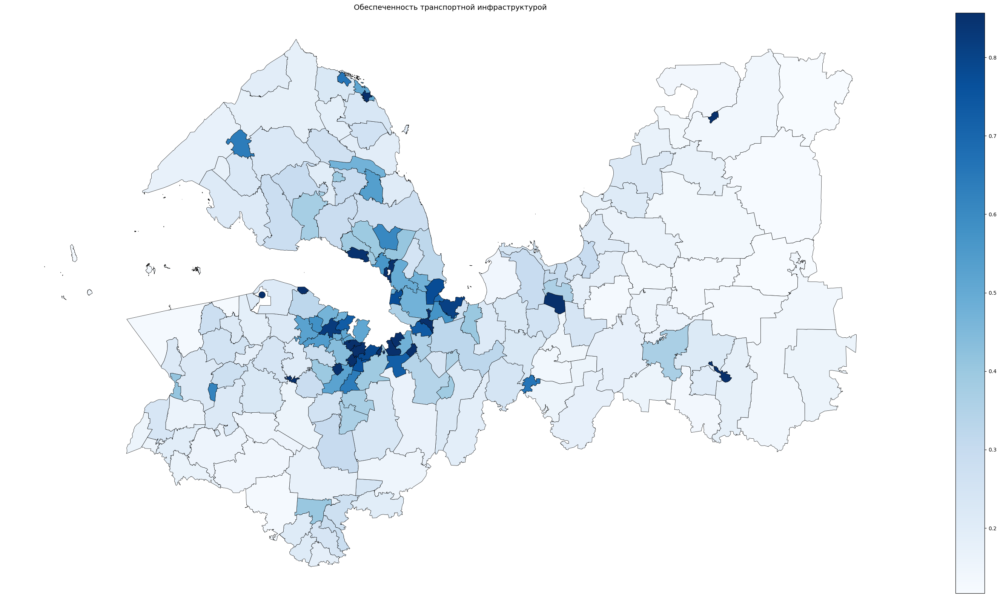

In [20]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_transport_provision(result):
    """
    Визуализирует обеспеченность транспортной инфраструктурой на карте с улучшенной цветовой градацией.
    
    :param result: GeoDataFrame с рассчитанными индексами обеспеченности
    """
    fig, ax = plt.subplots(figsize=(40, 20))
    
    # Ограничиваем влияние выбросов, используя 99-й процентиль
    vmin, vmax = np.percentile(result['transport_provision_index'], [1, 90])

    # Отображение карты с улучшенной цветовой шкалой
    result.plot(column='transport_provision_index', cmap='Blues', linewidth=0.5, 
                edgecolor='black', legend=True, ax=ax, vmin=vmin, vmax=vmax)
    
    # Убираем рамку с координатами
    ax.set_axis_off()
    
    # Добавляем заголовок
    plt.title("Обеспеченность транспортной инфраструктурой", fontsize=14)
    plt.show()

visualize_transport_provision(result)


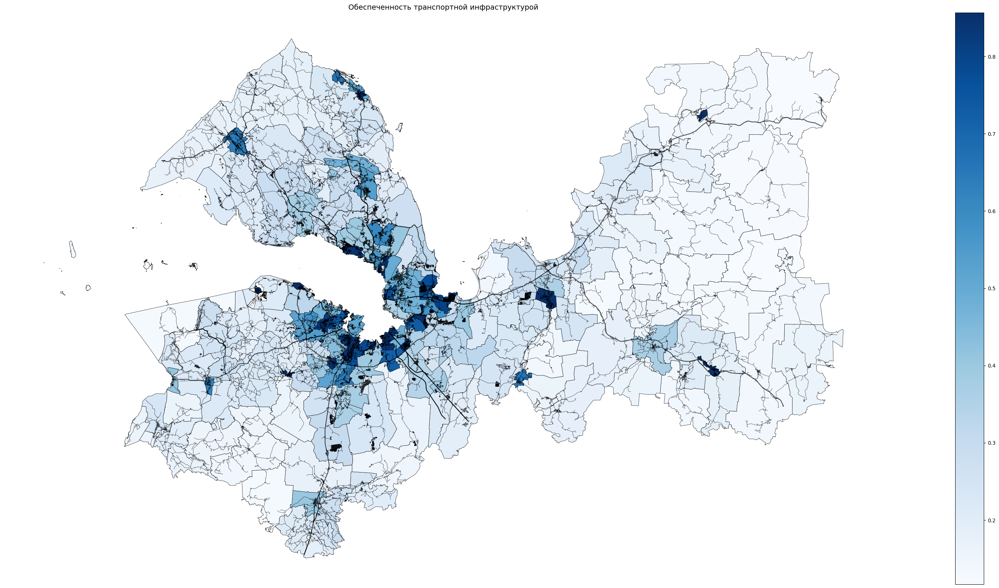

In [37]:
import matplotlib.pyplot as plt
import numpy as np
import json

def visualize_transport_provision(result, road_gdf):
    """
    Визуализирует обеспеченность транспортной инфраструктурой и отображает дороги.
    
    :param result: GeoDataFrame с рассчитанными индексами обеспеченности
    :param road_gdf: GeoDataFrame с дорогами
    """
    fig, ax = plt.subplots(figsize=(50, 20))
    
    # Ограничиваем влияние выбросов, используя 1-й и 99-й процентиль
    vmin, vmax = np.percentile(result['transport_provision_index'], [1, 90])

    # Отображение карты с улучшенной цветовой шкалой
    result.plot(column='transport_provision_index', cmap='Blues', linewidth=0.5, 
                edgecolor='black', legend=True, ax=ax, vmin=vmin, vmax=vmax)
    
    # Преобразуем properties из строки JSON в словарь, если нужно
    if isinstance(road_gdf['properties'].iloc[0], str):  
        road_gdf['properties'] = road_gdf['properties'].apply(json.loads)

    # Определяем ширину дорог в зависимости от свойства "reg"
    road_gdf['width'] = road_gdf['properties'].apply(lambda x: 1.5 if x.get('reg') == 1 else 0.6)

    # Визуализация дорог с прозрачностью 60%
    road_gdf.plot(ax=ax, color='black', linewidth=road_gdf['width'], alpha=0.7)
    
    # Убираем рамку с координатами
    ax.set_axis_off()
    
    # Добавляем заголовок
    plt.title("Обеспеченность транспортной инфраструктурой", fontsize=14)
    plt.show()

# Вызов функции
visualize_transport_provision(result, road_gdf)



# загрузка данных

In [2]:
def get_territories(parent_id : int | None = None, all_levels = False, geometry : bool = False) -> pd.DataFrame | gpd.GeoDataFrame:
    res = requests.get(f'{URBAN_API}/all_territories{"" if geometry else "_without_geometry"}', {
        'parent_id': parent_id,
        'get_all_levels': all_levels
    })
    res_json = res.json()
    if geometry:
        gdf = gpd.GeoDataFrame.from_features(res_json, crs=4326)
        return gdf.set_index('territory_id', drop=True)
    df = pd.DataFrame(res_json)
    return df.set_index('territory_id', drop=True)

territories_gdf = get_territories(1, all_levels = True, geometry=True)
territories_gdf

,geometry,territory_type,parent,name,level,properties,admin_center,target_city_type,okato_code,oktmo_code,is_city,created_at,updated_at
territory_id,,,,,,,,,,,,,
2,"POLYGON ((34.32834 59.19564, 34.32777 59.19548...","{'id': 2, 'name': 'Бокситогорский муниципальны...","{'id': 1, 'name': 'Бокситогорский муниципальны...",Бокситогорский муниципальный район,3,"{'Малые города': 2, 'Крупные города': 0, 'Числ...","{'id': 328, 'name': 'г. Бокситогорск'}",None,41203000000,41603000,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:18.795643Z
3,"POLYGON ((34.42169 59.68391, 34.42428 59.6715,...","{'id': 3, 'name': 'Самойловское сельское посел...","{'id': 2, 'name': 'Самойловское сельское посел...",Самойловское сельское поселение,4,"{'Численность населения': 2154, 'Административ...","{'id': 310, 'name': 'поселок Совхозный'}",None,41203876000,41603476,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:52.703740Z
4,"POLYGON ((34.30682 59.71494, 34.30791 59.71295...","{'id': 3, 'name': 'Большедворское сельское пос...","{'id': 2, 'name': 'Большедворское сельское пос...",Большедворское сельское поселение,4,"{'Численность населения': 1698, 'Административ...","{'id': 427, 'name': 'деревня Большой Двор'}",None,41203812000,41603412,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:34.396287Z
5,"POLYGON ((34.14251 59.48759, 34.13616 59.49064...","{'id': 3, 'name': 'Пикалевское городское посел...","{'id': 2, 'name': 'Пикалевское городское посел...",Пикалевское городское поселение,4,"{'Численность населения': 20169, 'Администрати...","{'id': 335, 'name': 'г. Пикалево'}",None,41440000000,41603102,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:34.930089Z
6,"POLYGON ((34.05997 59.15087, 34.06007 59.14658...","{'id': 3, 'name': 'Борское сельское поселение'}","{'id': 2, 'name': 'Борское сельское поселение'}",Борское сельское поселение,4,"{'Численность населения': 3393, 'Административ...","{'id': 2859, 'name': 'деревня Бор'}",None,41203816000,41603416,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:35.367513Z
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3133,"POLYGON ((31.26917 59.17068, 31.26868 59.16717...","{'id': 8, 'name': 'деревня Апраксин Бор'}","{'id': 205, 'name': 'деревня Апраксин Бор'}",деревня Апраксин Бор,5,{},None,None,41248844010,41648444111,True,2024-06-16T21:35:40.801621Z,2024-11-29T11:30:00.894489Z
3134,"POLYGON ((31.35423 59.18747, 31.35372 59.18396...","{'id': 8, 'name': 'деревня Александровка'}","{'id': 205, 'name': 'деревня Александровка'}",деревня Александровка,5,{},None,None,41248844002,41648444106,True,2024-06-16T21:35:40.801621Z,2024-11-29T11:30:01.002037Z
3135,"POLYGON ((31.50972 59.29449, 31.5092 59.29098,...","{'id': 8, 'name': 'деревня Большая Горка'}","{'id': 205, 'name': 'деревня Большая Горка'}",деревня Большая Горка,5,{},None,None,41248860002,41648444131,True,2024-06-16T21:35:40.801621Z,2024-11-29T11:30:01.099577Z


In [3]:
level_4_gdf = territories_gdf[territories_gdf['level'] == 3]
level_4_gdf

,geometry,territory_type,parent,name,level,properties,admin_center,target_city_type,okato_code,oktmo_code,is_city,created_at,updated_at
territory_id,,,,,,,,,,,,,
2,"POLYGON ((34.32834 59.19564, 34.32777 59.19548...","{'id': 2, 'name': 'Бокситогорский муниципальны...","{'id': 1, 'name': 'Бокситогорский муниципальны...",Бокситогорский муниципальный район,3,"{'Малые города': 2, 'Крупные города': 0, 'Числ...","{'id': 328, 'name': 'г. Бокситогорск'}",None,41203000000,41603000,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:18.795643Z
10,"POLYGON ((28.98894 59.48069, 28.98604 59.48401...","{'id': 2, 'name': 'Волосовский муниципальный р...","{'id': 1, 'name': 'Волосовский муниципальный р...",Волосовский муниципальный район,3,"{'Малые города': 0, 'Крупные города': 0, 'Числ...","{'id': 1268, 'name': 'г. Волосово'}",None,41206000000,41606000,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:18.238632Z
18,"POLYGON ((32.85314 60.51175, 32.84899 60.50379...","{'id': 2, 'name': 'Волховский муниципальный ра...","{'id': 1, 'name': 'Волховский муниципальный ра...",Волховский муниципальный район,3,"{'Малые города': 0, 'Крупные города': 0, 'Числ...","{'id': 1469, 'name': 'г. Волхов'}",None,41209000000,41609000,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:30.078398Z
34,"MULTIPOLYGON (((30.55161 59.96981, 30.552 59.9...","{'id': 2, 'name': 'Всеволожский муниципальный ...","{'id': 1, 'name': 'Всеволожский муниципальный ...",Всеволожский муниципальный район,3,"{'Малые города': 1, 'Крупные города': 0, 'Числ...","{'id': 1750, 'name': 'г. Всеволожск'}",None,41212000000,41612000,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:19.694739Z
54,"POLYGON ((28.9964 60.03638, 28.8588 60.04, 28....","{'id': 2, 'name': 'Выборгский муниципальный ра...","{'id': 1, 'name': 'Выборгский муниципальный ра...",Выборгский муниципальный район,3,"{'Малые города': 0, 'Крупные города': 0, 'Числ...","{'id': 1902, 'name': 'г. Выборг'}",None,41215000000,41615000,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:20.800683Z
67,"POLYGON ((29.63489 59.57073, 29.63372 59.57069...","{'id': 2, 'name': 'Гатчинский муниципальный ра...","{'id': 1, 'name': 'Гатчинский муниципальный ра...",Гатчинский муниципальный район,3,"{'Малые города': 14, 'Крупные города': 0, 'Чис...","{'id': 2082, 'name': 'г. Гатчина'}",None,41218000000,41618000,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:22.624512Z
85,"POLYGON ((28.19199 59.32665, 28.19187 59.32671...","{'id': 2, 'name': 'Кингисеппский муниципальный...","{'id': 1, 'name': 'Кингисеппский муниципальный...",Кингисеппский муниципальный район,3,"{'Малые города': 4, 'Крупные города': 0, 'Числ...","{'id': 466, 'name': 'г. Кингисепп'}",None,41221000000,41621000,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:23.108464Z
97,"POLYGON ((31.94177 59.42479, 31.94327 59.42428...","{'id': 2, 'name': 'Киришский муниципальный рай...","{'id': 1, 'name': 'Киришский муниципальный рай...",Киришский муниципальный район,3,"{'Малые города': 0, 'Крупные города': 0, 'Числ...","{'id': 656, 'name': 'г. Кириши'}",None,41224000000,41624000,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:18:36.039764Z
104,"POLYGON ((31.91715 59.95987, 31.91722 59.95916...","{'id': 2, 'name': 'Кировский муниципальный рай...","{'id': 1, 'name': 'Кировский муниципальный рай...",Кировский муниципальный район,3,"{'Малые города': 0, 'Крупные города': 0, 'Числ...","{'id': 733, 'name': 'г. Кировск'}",None,41225000000,41625000,False,2024-06-16T21:35:40.801621Z,2024-11-14T12:17:24.579917Z


In [23]:
import requests
import geopandas as gpd

URBAN_API = "https://urban-api.idu.kanootoko.org/api/v1"

params = {
    "territory_id" : 1,
    "service_type_id": 82,  # ID функции физического объекта
}

# Формируем URL для конкретной территории
territory_id = 1  # Пример ID территории
url = f"{URBAN_API}/territory/{territory_id}/services_geojson"

# Выполняем GET-запрос
response = requests.get(url, params=params)

res_json = response.json()
gdf = gpd.GeoDataFrame.from_features(res_json, crs=4326)
gdf

,geometry,service_id,service_type,territory_type,name,capacity_real,territories,properties,created_at,updated_at
0,"MULTIPOLYGON (((29.80363 59.70985, 29.80609 59...",589472,"{'service_type_id': 82, 'urban_function': {'id...",None,Ропша,10000,"[{'id': 1088, 'name': 'деревня Глядино'}]","{'name': 'Ропша', 'osm_id': '120159700', 'is_c...",2024-10-10T19:03:09.018828Z,2024-10-10T19:03:09.018828Z
1,"MULTIPOLYGON (((31.47636 59.84122, 31.47664 59...",589473,"{'service_type_id': 82, 'urban_function': {'id...",None,Путилово,10000,"[{'id': 108, 'name': 'Путиловское сельское пос...","{'name': 'Путилово', 'osm_id': '127166902', 'i...",2024-10-10T19:03:09.327439Z,2024-10-10T19:03:09.327439Z
2,"MULTIPOLYGON (((30.024 58.67899, 30.02596 58.6...",589474,"{'service_type_id': 82, 'urban_function': {'id...",None,(unnamed),10000,"[{'id': 140, 'name': 'Заклинское сельское посе...","{'osm_id': '87229455', 'is_capacity_real': False}",2024-10-10T19:03:09.355623Z,2024-10-10T19:03:09.355623Z
3,"MULTIPOLYGON (((33.58817 59.65265, 33.5898 59....",589475,"{'service_type_id': 82, 'urban_function': {'id...",None,(unnamed),10000,"[{'id': 2829, 'name': 'деревня Паголда'}]","{'osm_id': '316800479', 'is_capacity_real': Fa...",2024-10-10T19:03:09.357854Z,2024-10-10T19:03:09.357854Z
4,"MULTIPOLYGON (((29.983 59.48469, 29.98217 59.4...",589476,"{'service_type_id': 82, 'urban_function': {'id...",None,Сиворицы-2,10000,"[{'id': 2200, 'name': 'деревня Рябизи'}]","{'name': 'Сиворицы-2', 'osm_id': '1213570135',...",2024-10-10T19:03:09.358008Z,2024-10-10T19:03:09.358008Z
5,"MULTIPOLYGON (((28.72781 60.46191, 28.73004 60...",589477,"{'service_type_id': 82, 'urban_function': {'id...",None,Прибылово,10000,"[{'id': 55, 'name': 'Приморское городское посе...","{'name': 'Прибылово', 'osm_id': '2248596', 'is...",2024-10-10T19:03:09.358590Z,2024-10-10T19:03:09.358590Z
6,"MULTIPOLYGON (((30.0059 59.3541, 30.01403 59.3...",589478,"{'service_type_id': 82, 'urban_function': {'id...",None,Сиверский,10000,"[{'id': 67, 'name': 'Гатчинский муниципальный ...","{'name': 'Сиверский', 'osm_id': '252291127', '...",2024-10-10T19:03:09.362491Z,2024-10-10T19:03:09.362491Z
7,"MULTIPOLYGON (((29.64453 59.72244, 29.64853 59...",589479,"{'service_type_id': 82, 'urban_function': {'id...",None,Гостилицы,10000,"[{'id': 123, 'name': 'Гостилицкое сельское пос...","{'name': 'Гостилицы', 'osm_id': '122385688', '...",2024-10-10T19:03:11.642849Z,2024-10-10T19:03:11.642849Z
8,"MULTIPOLYGON (((30.27431 59.60399, 30.27503 59...",589480,"{'service_type_id': 82, 'urban_function': {'id...",None,Корпикюля,10000,"[{'id': 2154, 'name': 'деревня Шаглино'}]","{'name': 'Корпикюля', 'osm_id': '96886764', 'i...",2024-10-10T19:03:11.919207Z,2024-10-10T19:03:11.919207Z
9,"MULTIPOLYGON (((29.2128 59.40683, 29.21279 59....",589481,"{'service_type_id': 82, 'urban_function': {'id...",None,ВПП Сельскохозяйственной авиации,10000,"[{'id': 1365, 'name': 'деревня Смердовицы'}]","{'name': 'ВПП Сельскохозяйственной авиации', '...",2024-10-10T19:03:11.922185Z,2024-10-10T19:03:11.922185Z


In [24]:
gdf.to_file('airport.geojson')